# Libraries

In [1]:
import pickle
import os
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import SimpleITK as sitk
import pandas as pd

In [2]:
notebooks_path = Path.cwd()
lab_path = notebooks_path.parent
os.chdir(str(notebooks_path))
#print current working directory
print(lab_path)

/home/ricardino/Documents/MAIA/tercer_semestre/MISA/MISA_projects/Lab3


# Functions

## Utils

In [3]:
def save_as_pickle(obj, filename):
    with open(filename, 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)
        
def open_pickle(filename):
    with open(filename, 'rb') as f:
        return pickle.load(f)

def show_slice(img, slice_num, cmap='gray'):
    plt.figure(figsize=(10,10))
    plt.imshow(img[slice_num], cmap=cmap)
    plt.show()
    
def my_argmax(array):
    """argnmax function but turns intensity cases where more than one tissue has a pick probability to -1"""
    rows = np.where(array == array.max(axis=1)[:, None])[0]
    rows_multiple_max = rows[:-1][rows[:-1] == rows[1:]]
    my_argmax = array.argmax(axis=1)
    my_argmax[rows_multiple_max] = -1
    return my_argmax

def dice_score(img1,img2):
    """Dice score

    Args:
        img1 (3D array): FIrst image to compute Dice from
        img2 (3D array): FIrst image to compute Dice from

    Returns:
        float: Dice score value
    """
    intersection = np.logical_and(img1, img2)
    union = np.logical_or(img1, img2)
    dice = (2*np.sum(intersection))/(np.sum(union)+np.sum(intersection))
    return dice


## Dataset manipualtion

In [4]:
# Read patients in the test-set:
def getPatientNum():
    """gets patients id number of the test set

    Returns:
        _type_: _description_
    """
    test_set_path = str(lab_path) + '/data/test-set'
    aux_patients_list = os.listdir(test_set_path + '/testing-images')
    patients_list = []
    for pat in aux_patients_list:
        # Remove ".nii.gz" in the "testing-images" folder
        patients_list.append(pat.replace(".nii.gz", ""))
    return sorted(list(map(int, patients_list))) #return sorted version of the patients list

def getArrayfromPath(image_path, dtype = np.uint16):
    """Simply get array of image

    Args:
        image_path (str): image path

    Returns:
        array: array of the image
    """
    return sitk.GetArrayFromImage(sitk.ReadImage(image_path)).astype(dtype)

def get_testImage(id, skull_strip=False):
    """returns array of image given its path

    Args:
        id (int): id of patient (pat num)

    Returns:
        array: 3D image array
    """
    path_im = str(lab_path) + f'/data/test-set/testing-images/{id}.nii.gz'
    im = getArrayfromPath(path_im)
    if skull_strip:
        mask = getArrayfromPath(str(lab_path) + f'/data/test-set/testing-mask/{id}_1C.nii.gz')
        im_ns = im * mask
        return im_ns
    return im

In [5]:
# save the array as a new nifti image
def save_as_nifti(array, filename, reference_image):
    """Save array as nifti image

    Args:
        array (array): array to be saved
        filename (str): path to save
        reference_image (str): path of reference image
    """
    reference_image = sitk.ReadImage(reference_image)
    image = sitk.GetImageFromArray(array)
    image.SetOrigin(reference_image.GetOrigin())
    image.SetSpacing(reference_image.GetSpacing())
    image.SetDirection(reference_image.GetDirection())
    sitk.WriteImage(image, filename)

## Tissue models

In [6]:
def show_tissue_models(tissue_model):
    #We define the bins edge number
    bins = np.arange(tissue_model.shape[0]+1)
    #plot histogram of tissue models
    plt.plot(bins[:-1], tissue_model[:,0], label='CSF')
    plt.plot(bins[:-1], tissue_model[:,1], label='WM')
    plt.plot(bins[:-1], tissue_model[:,2], label='GM')
    plt.legend()
    plt.title('Tissue model')
    plt.show()
    
def maxProb_TModel(tissue_model):
    max_label = my_argmax(tissue_model)
    return max_label

In [7]:
def seg_wTModel(id, tissue_model,show=False, slice_num=150, save=False):
    """segments using the tissue model intensity information from atlas

    Args:
        id (int): pat num
        tissue_model (2D array): tissue model
        show (bool, optional): show segmentation. Defaults to False.

    Returns:
        3D array: segmentation
    """
    #get image path
    im = get_testImage(id, skull_strip=True) #array of image
    #Get tissue model
    LUT_TModel = maxProb_TModel(tissue_model) + 1 #shifted labels ot include background
    #enlarge tissue model to image intensities
    if im.max()>tissue_model.shape[0]:
        LUT_TModel = np.pad(LUT_TModel, (0, int(im.max())-tissue_model.shape[0]+1), 'constant', constant_values=0)
    #Use look up table on the original image intensities
    im_seg = LUT_TModel[im]
    show_slice(im_seg, slice_num, cmap='jet') if show else None
    #save as nii.gz file
    save_as_nifti(im_seg.astype(np.float64), str(lab_path) + f'/data/segmentations/seg_ours_Tmodels_{id}.nii', str(lab_path) + f'/data/test-set/testing-images/{id}.nii.gz') if save else None
    
    #get dice score
    dice = np.zeros(shape=(3,))
    for i in range(1,4):
        gt = getArrayfromPath(str(lab_path) + f'/data/test-set/testing-labels/{id}_3C.nii.gz')
        dice[i-1] = dice_score(gt==i, im_seg==i)
    
    return im_seg, dice

## Label propagation

In [8]:
def combine_atlas(path_csf, path_gm, path_wm):
    """stack atlases in one 3 channel volume

    Args:
        path_csf (str): csf path
        path_gm (str): gm path
        path_wm (str): wm path

    Returns:
        array: 4D array of atlases
    """

    csf_atlas = getArrayfromPath(path_csf)
    gm_atlas = getArrayfromPath(path_gm)
    wm_atlas = getArrayfromPath(path_wm)
    
    atlas = np.stack((csf_atlas, gm_atlas, wm_atlas), axis=0)
    
    return atlas

def image_registration(fixed_path, moving_path, show=False):
    """Give two images and the registration of both, and its transformation map will be given

    Args:
        fixed_path (str): fixed (template) image
        moving_path (str): moving image (image that will be transformed)

    Returns:
        sitk image, transformix map: transformed image and the transformation map
    """

    fixedImage = sitk.ReadImage(fixed_path)
    movingImage = sitk.ReadImage(moving_path)

    #Start registration settings
    elastixImageFilter = sitk.ElastixImageFilter() #Image filter object
    #Defining settings
    elastixImageFilter.SetFixedImage(fixedImage)
    elastixImageFilter.SetMovingImage(movingImage)

    #Run registration
    elastixImageFilter.Execute()

    #Get result image
    resultImage = elastixImageFilter.GetResultImage()

    #Transformation map
    transformParameterMap = elastixImageFilter.GetTransformParameterMap()
    #Set resampler interpolator as NearestNeighbor
    transformParameterMap[0]["ResampleInterpolator"] = ["FinalNearestNeighborInterpolator"]
    transformParameterMap[1]["ResampleInterpolator"] = ["FinalNearestNeighborInterpolator"]    
    transformParameterMap[2]["ResampleInterpolator"] = ["FinalNearestNeighborInterpolator"]
    
    show_registration(fixed_path, moving_path, resultImage) if show else None
    
    return resultImage, transformParameterMap

def show_registration(fixed_path, moving_path, resultImage):
    """shows original images and regitration results

    Args:
        fixed_path (str): path of fixed
        moving_path (str): path of moving
        resultImage (sitk image): _description_
    """
    fixed_np = getArrayfromPath(fixed_path)
    moving_np = getArrayfromPath(moving_path)
    resultImage_np = sitk.GetArrayFromImage(resultImage)
    diff_np = fixed_np - resultImage_np

    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(25,25))
    axs[0].imshow(fixed_np[125],cmap='gray')
    axs[0].set_title('fixed')
    axs[1].imshow(moving_np[125],cmap='gray')
    axs[1].set_title('moving')
    axs[2].imshow(resultImage_np[125],cmap='gray')
    axs[2].set_title('transformed')
    axs[3].imshow(diff_np[125],cmap='gray')
    axs[3].set_title('difference')


# 1.1) Tissue models: segmenation using just intensity information

The intensity number of the tissue model is: 3078


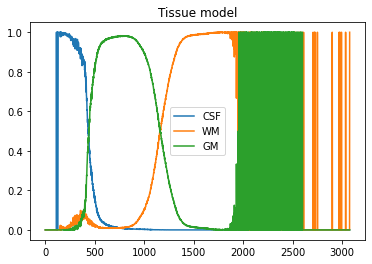

In [9]:
#Open tissue models
tissue_model = open_pickle(str(lab_path) + '/data/tissue_models/tissue_model.p')
print(f'The intensity number of the tissue model is: {tissue_model.shape[0]}')
show_tissue_models(tissue_model)

We would like to use the tissue model to segment the test set images.
We will use the intensity information only.

In [10]:
# #Get test patients
# patient_list  = getPatientNum()
# #Define dataframe to store dice results
# df = pd.DataFrame(columns=['id'])
# df['id'] = patient_list
# dice_all = np.zeros(shape=(len(patient_list), 3)) #array to store dice results
# for i, id in enumerate(patient_list): #Go through all patients
#     _, dice_all[i] = seg_wTModel(id, tissue_model, show=False, slice_num=150, save=False) #get segmentation from TModel
# df['dice_csf'] = dice_all[:,0] #assign dice results to dataframe
# df['dice_wm'] = dice_all[:,1]
# df['dice_gm'] = dice_all[:,2]
# #save dataframe as csv
# df.to_csv(str(lab_path) + '/data/results/dice_ours_TModel.csv', index=False)

# 2.1) Label propagation using geometric information from atlas

## Functions

In [11]:
def transform(transformParameterMap, moving_path, save=False, save_path=None):
    """Transforms the moving image with the given transformation map

    Args:
        transformParameterMap (transformix map): map of transformation
        moving_path (str): path of moving image
        save (bool, optional): whether to save the transformed image. Defaults to False.
        save_path (str, optional): path to save the transformed image. Defaults to None.

    Returns:
        sitk image: transformed image
    """
    movingImage = sitk.ReadImage(moving_path)
    transformixImageFilter = sitk.TransformixImageFilter()
    transformixImageFilter.SetTransformParameterMap(transformParameterMap)
    transformixImageFilter.SetMovingImage(movingImage)
    transformixImageFilter.Execute()
    resultImage = transformixImageFilter.GetResultImage()
    if save:
        sitk.WriteImage(resultImage, save_path)
    return sitk.GetArrayFromImage(resultImage)

In [12]:
def seg_wPropLabels(id, show=False, slice_num=150, save=False):

    #Paths for this patient
    fixed_path = str(lab_path) + f'/data/test-set/testing-images/{id}.nii.gz'
    fixed_shape = getArrayfromPath(fixed_path).shape
    moving_path = str(lab_path) + '/data/prob_atlas/template.nii'
    fixed_mask_path = str(lab_path) + f'/data/test-set/testing-mask/{id}_1C.nii.gz'

    _, transformParameterMap = image_registration(fixed_path, moving_path, show=True) #register images

    #propagate labels for each tissue type
    prop_labels = np.zeros(shape=(3,)+ fixed_shape)
    for i, tissue in enumerate(['csf', 'wm', 'gm']):
        #define label path
        label_path = str(lab_path) + f'/data/prob_atlas/{tissue}_atlas.nii'
        #propagate labels and store in array
        prop_labels[i] = transform(transformParameterMap, label_path, save=True, save_path=str(lab_path) + f'/data/segmentations/prob_ours_labelprop_{tissue}_{id}.nii')

    #Get segmentation from propagated labels
    im_seg = np.argmax(prop_labels, axis=0) + 1 #max argument and adding one
    mask = getArrayfromPath(fixed_mask_path) #get mask
    im_seg = im_seg * mask #apply mask to segmentation
    
    show_slice(im_seg, slice_num, cmap='jet') if show else None
    #save as nii.gz file
    save_as_nifti(im_seg.astype(np.float64), str(lab_path) + f'/data/segmentations/seg_ours_labelProp_{id}.nii', fixed_path) if save else None
    
    #get dice score
    dice = np.zeros(shape=(3,))
    for i in range(1,4):
        gt = getArrayfromPath(str(lab_path) + f'/data/test-set/testing-labels/{id}_3C.nii.gz')
        dice[i-1] = dice_score(gt==i, im_seg==i)
    
    return im_seg, dice

## IMP

Installing all components.
InstallingComponents was successful.

ELASTIX version: 5.000
Command line options from ElastixBase:
-fMask    unspecified, so no fixed mask used
-mMask    unspecified, so no moving mask used
-out      ./
-threads  unspecified, so all available threads are used
  The default value "true" is used instead.

  From elastix 4.8 it defaults to true!
This may change the behavior of your registrations considerably.

Command line options from TransformBase:
-t0       unspecified, so no initial transform used

Reading images...
Reading images took 0 ms.

  A default pyramid schedule is used.
  A default pyramid schedule is used.
  The default value "GeometricalCenter" is used instead.
Transform parameters are initialized as: [0, 14.5, 14.5]
Initialization of all components (before registration) took: 0 ms.
Preparation of the image pyramids took: 1755 ms.

Resolution: 0
  The default value "false" is used instead.
  The default value "true" is used instead.
Setting the 

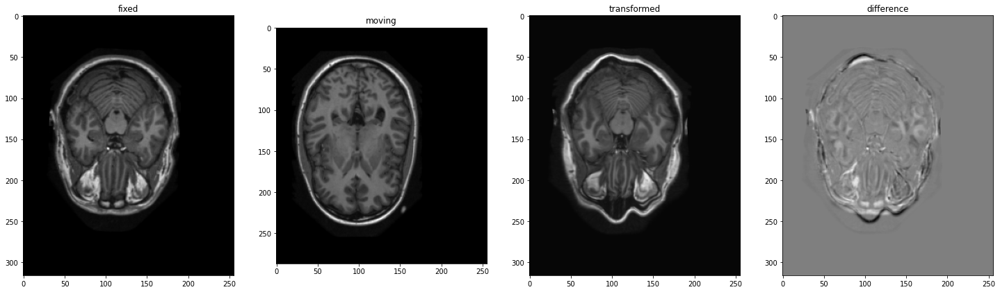

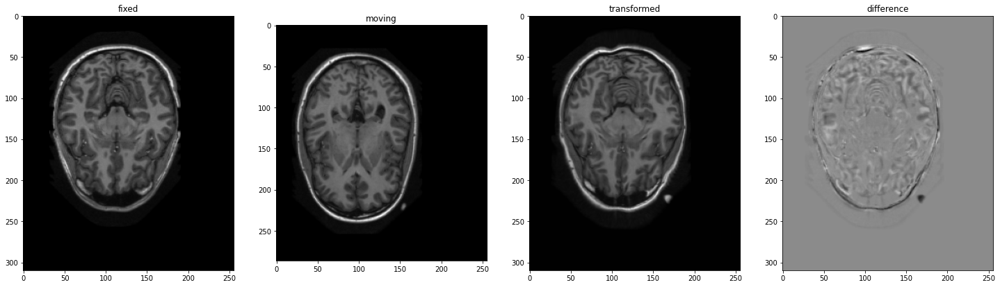

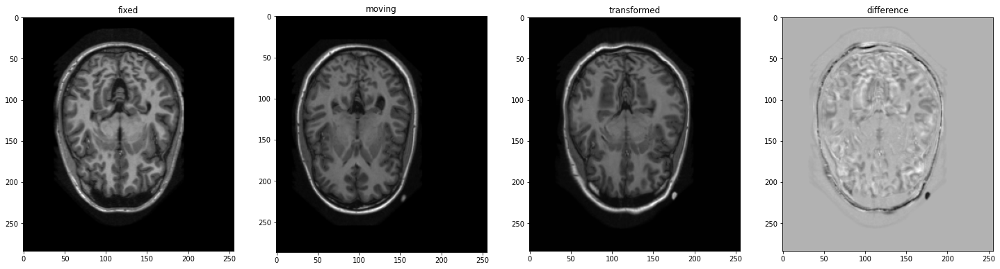

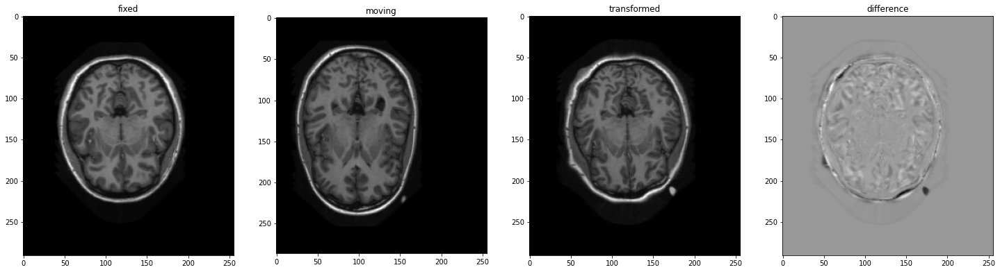

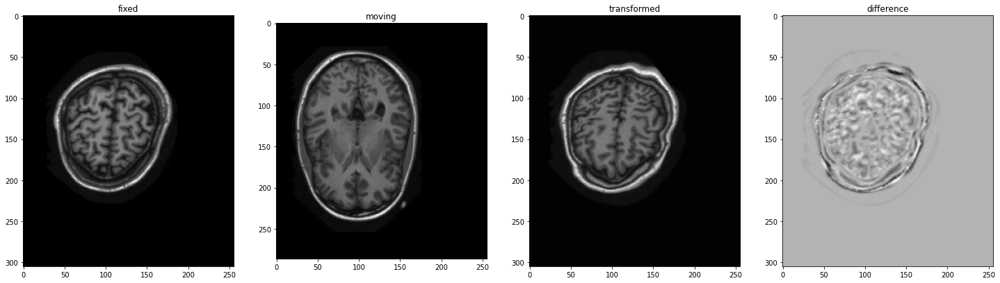

...

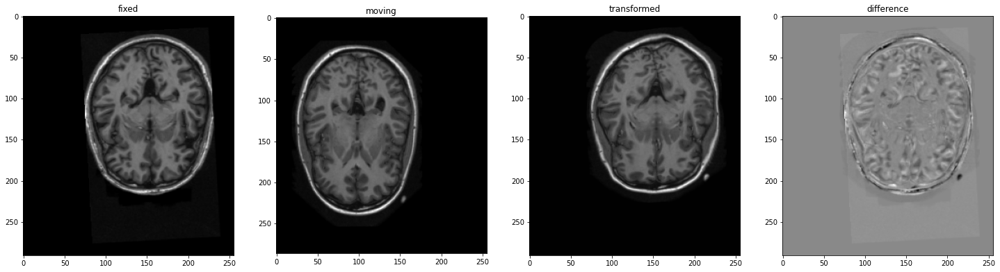

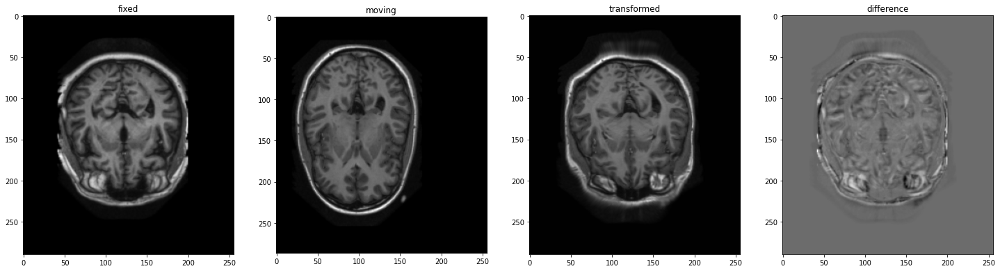

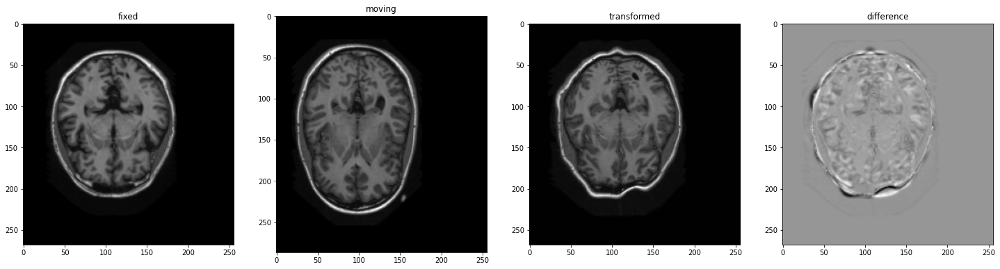

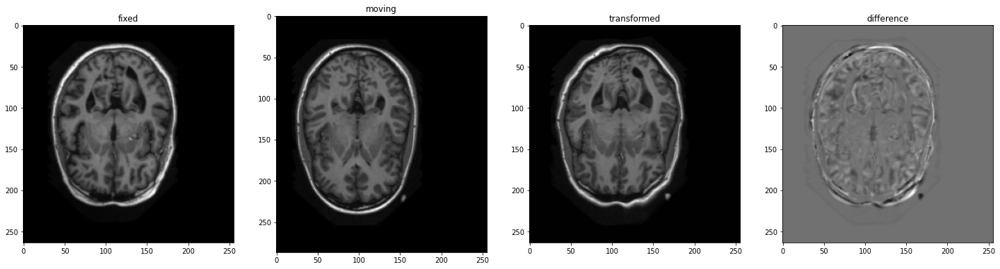

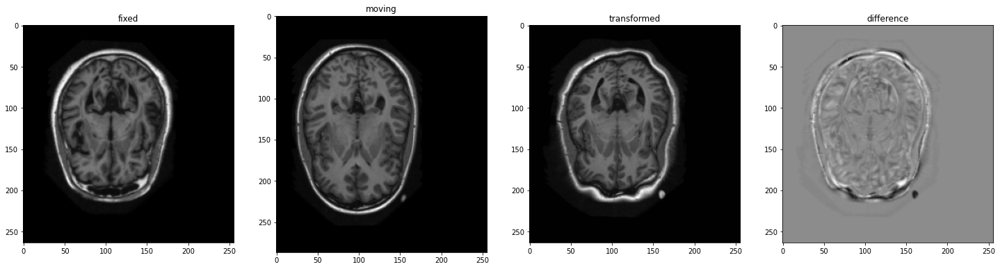

In [13]:
#Get test patients
patient_list  = getPatientNum()
#Define dataframe to store dice results
df = pd.DataFrame(columns=['id'])
df['id'] = patient_list
dice_all = np.zeros(shape=(len(patient_list), 3)) #array to store dice results
for i, id in enumerate(patient_list): #Go through all patients
    _, dice_all[i] = seg_wPropLabels(id, show=False, slice_num=150, save=True) #get segmentation from TModel
df['dice_csf'] = dice_all[:,0] #assign dice results to dataframe
df['dice_wm'] = dice_all[:,1]
df['dice_gm'] = dice_all[:,2]
#save dataframe as csv
df.to_csv(str(lab_path) + '/data/results/dice_ours_propLabels.csv', index=False)

# 2.3) Bayesian framework

## Functions

In [14]:
def get_TModel_prob(id, tissue_model, show=False, slice_num=150, save=False):
    """segments using the tissue model intensity information from atlas

    Args:
        id (int): pat num
        tissue_model (2D array): tissue model
        show (bool, optional): show segmentation. Defaults to False.

    Returns:
        3D array: segmentation
    """
    for i, tissue in enumerate(['csf', 'wm', 'gm']):
        #get image path
        im = get_testImage(id, skull_strip=True) #array of image
        #Get tissue model
        LUT_TModel = tissue_model[:,i] #shifted labels ot include background
        #enlarge tissue model to image intensities
        if im.max()>tissue_model.shape[0]:
            LUT_TModel = np.pad(LUT_TModel, (0, int(im.max())-tissue_model.shape[0]+1), 'constant', constant_values=0)
        #Use look up table on the original image intensities
        im_prob = LUT_TModel[im]
        show_slice(im_prob, slice_num, cmap='jet') if show else None
        #save as nii.gz file
        save_as_nifti(im_prob.astype(np.float64), str(lab_path) + f'/data/segmentations/prob_ours_Tmodels_{tissue}_{id}.nii', str(lab_path) + f'/data/test-set/testing-images/{id}.nii.gz') if save else None
        
    return im_prob

In [15]:
def save_allPat_Tmodel_prob():
    patient_list  = getPatientNum()
    tissue_model = open_pickle(str(lab_path) + '/data/tissue_models/tissue_model.p')
    for id in patient_list:    
        _ = get_TModel_prob(id, tissue_model, show=False, slice_num=140, save=True)

## IMP

First we will get the tissue probability for each tissue. We need this to be able to multiply with the atlas probability according to the bayesian framework.

In [16]:
# save_allPat_Tmodel_prob()

Now we can multiply the atlas probability with the tissue probability.

In [20]:
def seg_Bayesian(id, show=False, slice_num=150, save=False):

    im = get_testImage(id, skull_strip=True)
    prob_bayesian = np.zeros(shape=(3,)+ im.shape)
    for i, tissue in enumerate(['csf', 'wm', 'gm']):
        #paths for probability maps
        path_prob_Tmodel = str(lab_path) + f'/data/segmentations/prob_ours_Tmodels_{tissue}_{id}.nii'
        path_prob_labelprop = str(lab_path) + f'/data/segmentations/prob_ours_labelprop_{tissue}_{id}.nii'
        #get array of probability maps
        prob_Tmodel = getArrayfromPath(path_prob_Tmodel, dtype=np.float32)
        prob__labelprop = getArrayfromPath(path_prob_labelprop, dtype=np.float32)
        #Multiply according to Bayesian framework
        prob_bayesian[i] = prob_Tmodel*prob__labelprop
        
    bayesian_seg = np.argmax(prob_bayesian, axis=0) + 1 #max argument and adding one
    mask_path = str(lab_path) + f'/data/test-set/testing-mask/{id}_1C.nii.gz'
    mask = getArrayfromPath(mask_path) #get mask from propagated labels
    bayesian_seg = bayesian_seg * mask #apply mask to segmentation
    
    show_slice(bayesian_seg, slice_num, cmap='jet') if show else None
    #save as nii.gz file
    save_as_nifti(bayesian_seg.astype(np.float64), str(lab_path) + f'/data/segmentations/seg_ours_bayesian_{id}.nii', path_prob_Tmodel) if save else None
    
    #get dice score
    dice = np.zeros(shape=(3,))
    for i in range(1,4):
        gt = getArrayfromPath(str(lab_path) + f'/data/test-set/testing-labels/{id}_3C.nii.gz')
        dice[i-1] = dice_score(gt==i, bayesian_seg==i)
        
    return bayesian_seg, dice

In [19]:
#Get test patients
patient_list  = getPatientNum()
#Define dataframe to store dice results
df = pd.DataFrame(columns=['id'])
df['id'] = patient_list
dice_all = np.zeros(shape=(len(patient_list), 3)) #array to store dice results
for i, id in enumerate(patient_list): #Go through all patients
    _, dice_all[i] = seg_Bayesian(id, show=False, slice_num=150, save=True) #get segmentation from bayesian framework
df['dice_csf'] = dice_all[:,0] #assign dice results to dataframe
df['dice_wm'] = dice_all[:,1]
df['dice_gm'] = dice_all[:,2]
#save dataframe as csv
df.to_csv(str(lab_path) + '/data/results/dice_ours_bayesian.csv', index=False)
